# Gastrulation

In [1]:
%load_ext autoreload
%load_ext autotime

import os
import glob
import random
import sys

# import from absolute directory
srcdir = '/Users/pengzhizhang/cellDancer/src'
sys.path.append(srcdir)

import matplotlib.pyplot as plt
import pandas as pd

time: 1.22 s (started: 2022-05-18 17:19:13 -05:00)


In [2]:
import celldancer.cdplt as cdplt
from celldancer.cdplt import colormap
from celldancer import velocity_estimation
from celldancer.compute_cell_velocity import compute_cell_velocity
from celldancer.pseudo_time import pseudo_time

time: 3.76 s (started: 2022-05-18 17:19:14 -05:00)


## Set Parameters

In [3]:
n_neighbors=10
downsample_step=(100,100)

time: 641 µs (started: 2022-05-18 17:19:18 -05:00)


## Load detail

In [4]:
detail_result_path = '/Users/pengzhizhang/pseudotime/data/Gastrulation/velocity_result'
output_path = os.getcwd()
detail_file = os.path.join(detail_result_path,'combined_detail_2000_genes_with_bin_and_smooth.csv')
load_cellDancer=pd.read_csv(detail_file)

time: 37.6 s (started: 2022-05-18 17:19:54 -05:00)


In [6]:
%autoreload 2

gene_choice=list(set(load_cellDancer.gene_name))
load_cellDancer = compute_cell_velocity(
    load_cellDancer=load_cellDancer,
    gene_list=gene_choice,
    mode="gene",
    transfer_mode='power10',
    n_neighbors=n_neighbors,
    step=downsample_step)

(genes, cells): (2000, 12329)
After downsampling, there are  951 cells.
time: 1min (started: 2022-05-18 17:26:58 -05:00)


In [7]:
load_cellDancer

,cellIndex,gene_name,s0,u0,s1,u1,alpha,beta,gamma,cost,clusters,cellID,embedding1,embedding2,velocity1,velocity2
0,0,2810025M15Rik,1.515440,0.000000,1.514860,0.000022,0.001560,0.022612,0.005908,0.087183,Blood progenitors 2,cell_363,3.460521,15.574629,NaN,NaN
1,1,2810025M15Rik,1.574459,0.000000,1.573860,0.000022,0.001522,0.022650,0.005876,0.087183,Blood progenitors 2,cell_382,2.490433,14.971734,NaN,NaN
2,2,2810025M15Rik,1.744201,0.000000,1.743548,0.000020,0.001426,0.022751,0.005787,0.087183,Blood progenitors 2,cell_385,2.351203,15.267069,NaN,NaN
3,3,2810025M15Rik,1.332406,0.000000,1.331888,0.000024,0.001682,0.022495,0.006009,0.087183,Blood progenitors 2,cell_393,5.899098,14.388825,NaN,NaN
4,4,2810025M15Rik,1.261786,0.000000,1.261292,0.000025,0.001732,0.022449,0.006049,0.087183,Blood progenitors 2,cell_398,4.823139,15.374831,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24657995,12324,Zrsr2,0.255452,0.030816,0.323642,0.022484,0.005919,0.101278,0.144163,0.126370,Erythroid3,cell_139318,8.032358,7.603037,NaN,NaN
24657996,12325,Zrsr2,0.204272,0.049630,0.322781,0.036203,0.008434,0.100651,0.142879,0.126370,Erythroid3,cell_139321,10.352904,6.446736,NaN,NaN
24657997,12326,Zrsr2,0.230350,0.050146,0.349145,0.036532,0.008174,0.100769,0.143180,0.126370,Erythroid3,cell_139326,9.464873,7.261099,NaN,NaN
24657998,12327,Zrsr2,0.236227,0.052799,0.361591,0.038445,0.008380,0.100769,0.143180,0.126370,Erythroid3,cell_139327,9.990495,7.243880,NaN,NaN


time: 16.4 ms (started: 2022-05-18 17:28:10 -05:00)


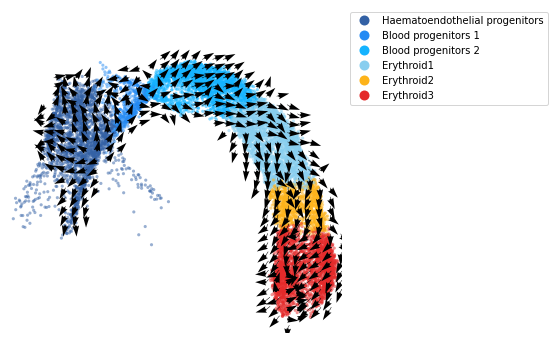

time: 7.36 s (started: 2022-05-18 17:28:16 -05:00)


In [8]:
%autoreload 2

fig, ax = plt.subplots(figsize=(6,6))
im = cdplt.cell.scatter_cell(ax,load_cellDancer, colors=colormap.colormap_erythroid, alpha=0.5, s=10,
             velocity=True, custom_xlim=(-5,11), custom_ylim=(4,18), legend='on')
ax.axis('off')
plt.show()

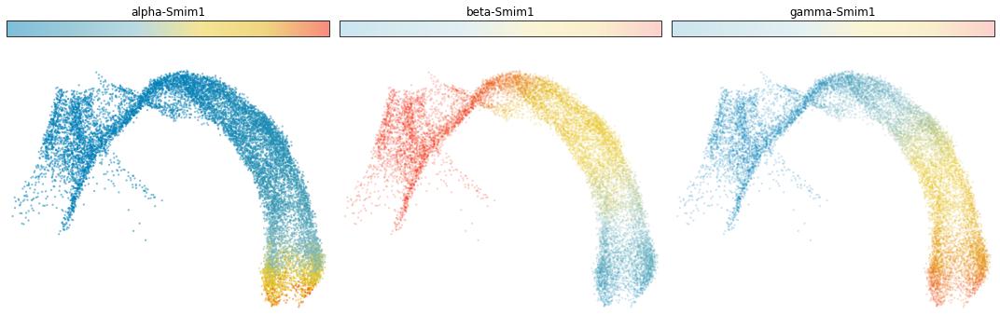

time: 5.9 s (started: 2022-05-05 09:34:06 -05:00)


In [17]:
fig, ax = plt.subplots(ncols=3, figsize=(15,5))
gene = 'Smim1'
im0=cdplt.cell.scatter_cell(ax[0],load_cellDancer, colors='alpha', 
             gene_name=gene, velocity=False, custom_xlim=(-5,11), custom_ylim=(4,18))
im1=cdplt.cell.scatter_cell(ax[1],load_cellDancer, colors='beta', 
             gene_name=gene, velocity=False, alpha=0.2, custom_xlim=(-5,11), custom_ylim=(4,18))
im2=cdplt.cell.scatter_cell(ax[2],load_cellDancer, colors='gamma', 
             gene_name=gene, velocity=False, alpha=0.2, custom_xlim=(-5,11), custom_ylim=(4,18))
ax[0].axis('off')
ax[1].axis('off')
ax[2].axis('off')
ax[0].set_title('alpha-'+gene)
ax[1].set_title('beta-'+gene)
ax[2].set_title('gamma-'+gene)
plt.tight_layout()
plt.show()

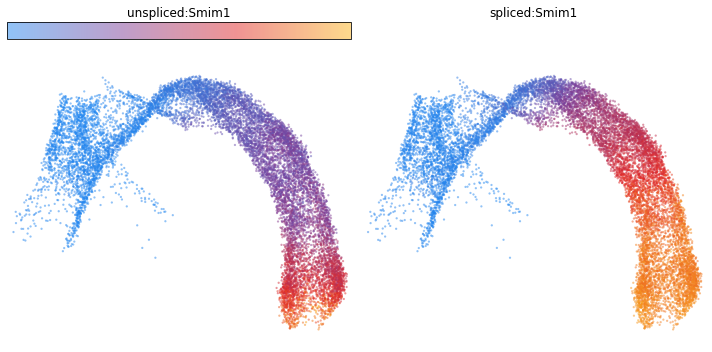

time: 3.95 s (started: 2022-05-05 09:33:10 -05:00)


In [15]:
%autoreload 2

fig, ax = plt.subplots(ncols=2, figsize=(10,5))
gene = 'Smim1'
im0=cdplt.cell.scatter_cell(ax[0],load_cellDancer, colors='unspliced', 
             gene_name=gene, velocity=False, custom_xlim=(-5,11), custom_ylim=(4,18), colorbar='on')
im1=cdplt.cell.scatter_cell(ax[1],load_cellDancer, colors='spliced', 
             gene_name=gene, velocity=False, custom_xlim=(-5,11), custom_ylim=(4,18), colorbar='off')

ax[0].axis('off')
ax[1].axis('off')
ax[0].set_title('unspliced:'+gene)
ax[1].set_title('spliced:'+gene)
plt.tight_layout()
plt.show()

## Estimate pseudotime

In [10]:
%autoreload 2

cell_time = dict()
dt = 0.01
#t_total = {dt:int(10/dt)} 
t_total = {0.01: 10000}
n_repeats = 10

grid = (20,20)

load_cellDancer = pseudo_time(
    load_cellDancer=load_cellDancer, 
    grid=grid, 
    dt=dt, 
    t_total=t_total[dt], 
    n_repeats=n_repeats, 
    downsample_step=downsample_step,
    n_paths = 3,
    psrng_seeds_diffusion=[i for i in range(n_repeats)],
    activate_umap_paths_divider=False,
    n_jobs=12)

IndexError: index -26 is out of bounds for axis 1 with size 21

time: 2.38 s (started: 2022-05-18 17:31:18 -05:00)


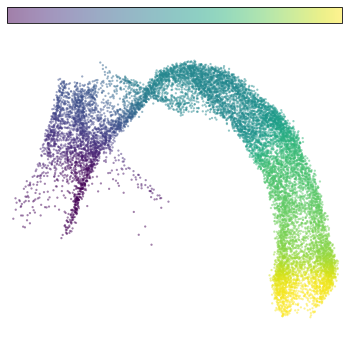

time: 5.99 s (started: 2022-05-05 16:16:52 -05:00)


In [31]:
fig, ax = plt.subplots(figsize=(6,6))
clusters = load_cellDancer['clusters'].drop_duplicates().to_list()
im=cdplt.cell.scatter_cell(ax,load_cellDancer, colors='pseudotime', alpha=0.5, 
             velocity=False, custom_xlim=(-5,11), custom_ylim=(4,18))
ax.axis('off')
plt.show()

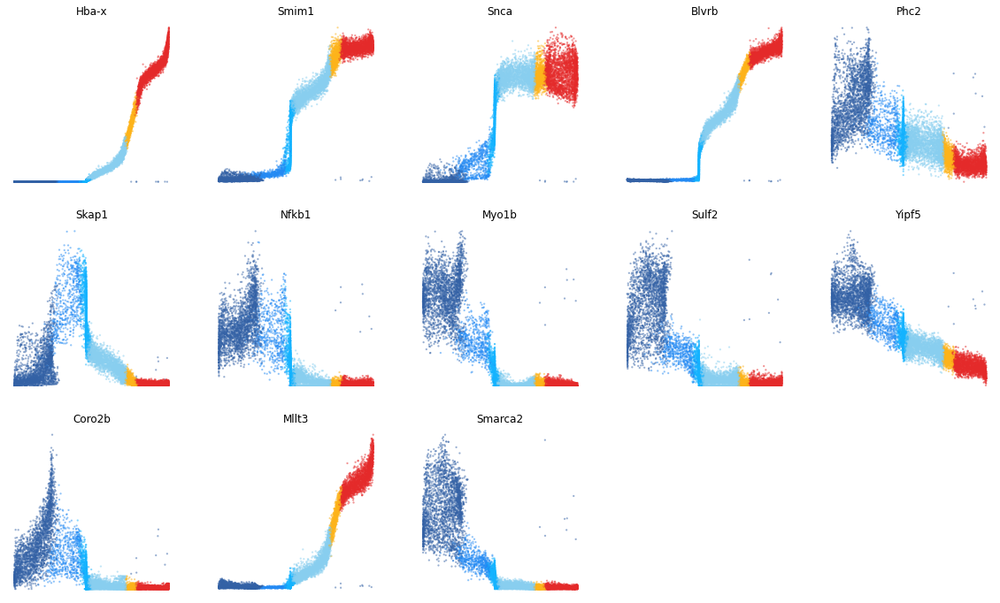

time: 25.6 s (started: 2022-05-05 16:19:22 -05:00)


In [32]:
# Show legend only
#_, ax = plt.subplots()
#cdplt.gene.scatter_gene(ax=ax,legend='only', colors=colormap.colormap_erythroid, s = 10, gene_name=None)
#ax.axis('off')
#plt.show()
gene_list=['Hba-x','Smim1','Snca','Blvrb','Phc2',
           'Skap1','Nfkb1','Myo1b','Sulf2','Yipf5',
           'Coro2b','Mllt3','Smarca2']
import math
ncols=5
fig = plt.figure(figsize=(20,12))


for i in range(len(gene_list)):
    ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
    cdplt.gene.scatter_gene(
        ax=ax,
        x='pseudotime',
        y='spliced',
        load_cellDancer=load_cellDancer,
        save_path=None,
        custom_xlim=None,
        custom_ylim=None,
        colors=colormap.colormap_erythroid,
        alpha=0.5, 
        s = 5,
        velocity=False,
        gene_name=gene_list[i])

    ax.set_title(gene_list[i])
    ax.axis('off')

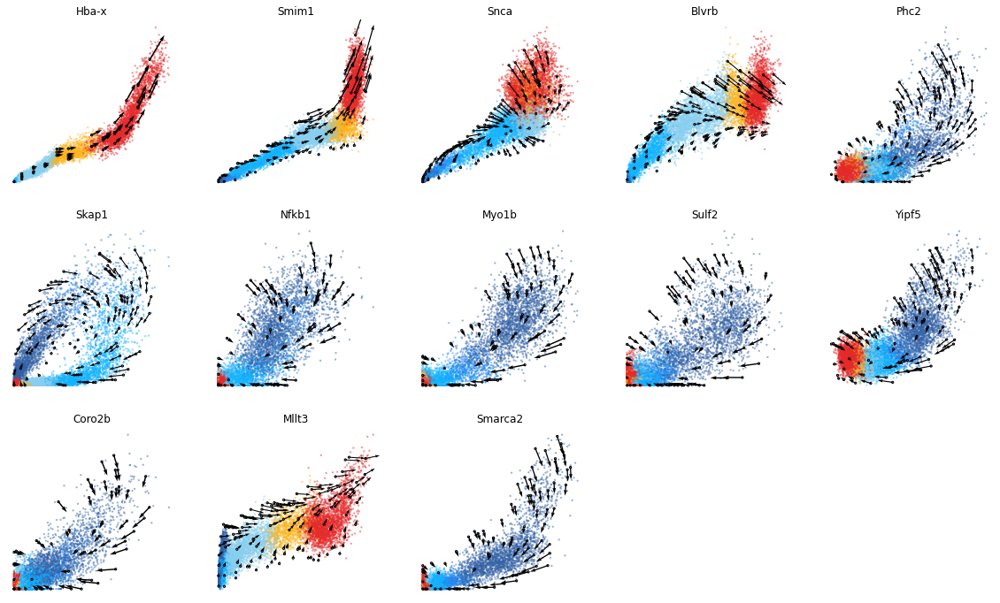

time: 39.9 s (started: 2022-05-05 16:19:47 -05:00)


In [33]:
ncols=5
fig = plt.figure(figsize=(20,12))


for i in range(len(gene_list)):
    ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
    cdplt.gene.scatter_gene(
        ax=ax,
        x='spliced',
        y='unspliced',
        load_cellDancer=load_cellDancer,
        save_path=None,
        custom_xlim=None,
        custom_ylim=None,
        colors=colormap.colormap_erythroid,
        alpha=0.5, 
        s = 5,
        velocity=True,
        gene_name=gene_list[i])
    
    ax.set_title(gene_list[i])
    ax.axis('off')

plt.show()


## Graph representation of the cell fates


In [248]:
#!conda install -c pyviz holoviews bokeh -y
%autoreload 2
import pandas as pd 
import numpy as np
import os
import networkx as nx

import datashader as ds
import datashader.transfer_functions as tf
from datashader.layout import forceatlas2_layout
from datashader.bundling import connect_edges, hammer_bundle
from celldancer.utilities import extract_from_df

time: 1.15 ms (started: 2022-05-04 10:19:06 -05:00)


In [534]:
def layout_graph(data, radius):
    def create_KNN_based_graph():
        from sklearn.neighbors import NearestNeighbors
        neigh = NearestNeighbors(radius = radius)
        neigh.fit(embedding_ds)
        nn_graph = neigh.radius_neighbors_graph(embedding_ds, mode='connectivity')
        nn_array = nn_graph.toarray()
   
        # nn_array is effectively the edge list
        # Keep track of cells of 0 timeshift.
        node_list = [(i, {'ptime': ptime_ds[i,0], 'cluster':clusters_ds[i]}) 
                     for i in range(len(embedding_ds))]
        
        dtime = ptime_ds[:,0] - ptime_ds
        INF = 100./np.min(np.abs(dtime[dtime != 0]))

        # upper triangle of the knn array (i<j and nn_array[i,j] = 1)
        edge_filter = np.triu(nn_array, k=1)
        (i,j) = np.where(edge_filter != 0)

        # for forcedirected layouts, 
        # edge length is positively correlated with weight.
        # hence 1/dtime here as the weight
        # Created for directed graph
        edge_list = list()
        for a,b,w in zip(i,j, dtime[i,j]):
            if w>0:
                edge_list.append((a, b, 1/w))
            elif w<0:
                edge_list.append((b, a, -1/w))
            else:
                #print(a,b)
                edge_list.append((a, b, INF))

        G = nx.Graph()
        G.add_nodes_from(node_list)
        G.add_weighted_edges_from(edge_list)

        return G
    
    
    embedding = extract_from_df(data, ['embedding1', 'embedding2'])
    sample_cells = load_cellDancer['velocity1'][:n_cells].dropna().index
    clusters = extract_from_df(data, ['clusters'])
    ptime = extract_from_df(data, ['pseudotime'])
    
    embedding_ds = embedding[sample_cells]
    ptime_ds = ptime[sample_cells]
    clusters_ds = clusters[sample_cells]

    G = create_KNN_based_graph()
    
    index = np.array(range(len(embedding_ds)), dtype=int)[:,None]
    
    # NOTE!!!
    # the third column of nodes df has to be "index"
    nodes = pd.DataFrame(np.hstack((index, embedding_ds, ptime_ds, clusters_ds)), 
                         columns=['name','x','y','ptime','clusters'])
    
    edges = pd.DataFrame([(i[0], i[1], G.edges[i]['weight']) for i in G.edges], 
                         columns=['source', 'target', 'weight'])   
    return G, nodes, edges


G, nodes, edges = layout_graph(load_cellDancer, 1)

time: 4.06 s (started: 2022-05-04 14:48:29 -05:00)


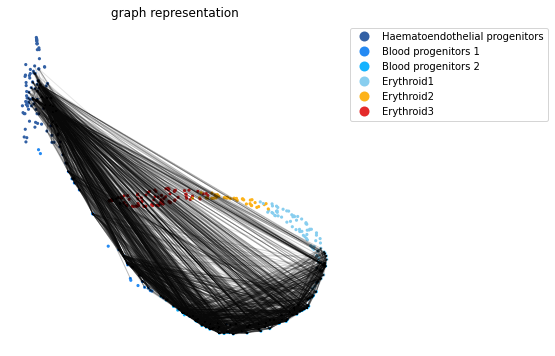

time: 10min 3s (started: 2022-05-04 16:31:01 -05:00)


In [593]:
%autoreload 2


forcedirected = forceatlas2_layout(nodes[['name','clusters']], 
                                   edges, weight='weight', iterations=10000, seed=10)
forcedirected['gene_name']='gene'


fig, ax = plt.subplots(figsize=(6,6))
cdplt.gene.scatter_gene(
    ax=ax,
    x='y',
    y='x',
    load_cellDancer=forcedirected,
    save_path=None,
    custom_xlim=None,
    custom_ylim=None,
    colors=colormap.colormap_erythroid,
    alpha=1, 
    s = 10,
    gene_name='gene',
    legend='on')

for index, row in edges.iterrows():
    s = int(row['source'])
    t = int(row['target'])
    x_s = forcedirected.loc[edges['source'][s],['y']].to_numpy()[0]
    x_t = forcedirected.loc[edges['target'][t],['y']].to_numpy()[0]
    y_s = forcedirected.loc[edges['source'][s],['x']].to_numpy()[0]
    y_t = forcedirected.loc[edges['target'][t],['x']].to_numpy()[0]
    plt.plot([x_s, x_t], [y_s, y_t], 'k-', lw=1, alpha=0.1)
    
ax.set_title('graph representation')
ax.axis('off')

plt.show()

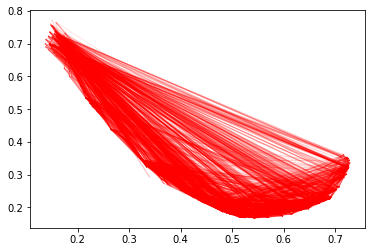

time: 13.2 s (started: 2022-05-04 16:30:06 -05:00)


In [592]:
for index, row in edges.iterrows():
    s = int(row['source'])
    t = int(row['target'])
    x_s = forcedirected.loc[edges['source'][s],['y']].to_numpy()[0]
    x_t = forcedirected.loc[edges['target'][t],['y']].to_numpy()[0]
    y_s = forcedirected.loc[edges['source'][s],['x']].to_numpy()[0]
    y_t = forcedirected.loc[edges['target'][t],['x']].to_numpy()[0]
    plt.plot([x_s, x_t], [y_s, y_t], 'k-', lw=1, alpha=0.1)
plt.show()

In [249]:
def nodesplot(nodes, name=None, canvas=None, cat=None):
    canvas = ds.Canvas(**cvsopts) if canvas is None else canvas
    aggregator=None if cat is None else ds.count_cat(cat)
    agg=canvas.points(nodes,'x','y',aggregator)
    return tf.spread(tf.shade(agg), px=1, name=name)

def edgesplot(edges, name=None, canvas=None):
    canvas = ds.Canvas(**cvsopts) if canvas is None else canvas
    return tf.shade(canvas.line(edges, 'x','y', agg=ds.count()), name=name)
    
def graphplot(nodes, edges, name="", canvas=None, cat=None):
    if canvas is None:
        xr = nodes.x.min(), nodes.x.max()
        yr = nodes.y.min(), nodes.y.max()
        canvas = ds.Canvas(**cvsopts)
        
    np = nodesplot(nodes, name + " nodes", canvas, cat)
    ep = edgesplot(edges, name + " edges", canvas)
    return tf.stack(ep, np, how="over", name=name)

time: 1.52 ms (started: 2022-05-04 10:32:10 -05:00)


CPU times: user 40.3 ms, sys: 493 µs, total: 40.8 ms
Wall time: 41.8 ms
CPU times: user 38.3 ms, sys: 2.97 ms, total: 41.3 ms
Wall time: 43 ms


Circular layout,Force-directed

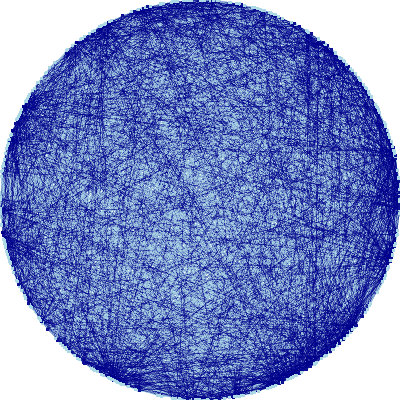
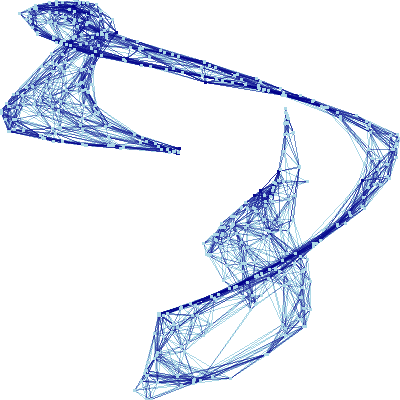

time: 11.1 s (started: 2022-05-04 14:48:49 -05:00)


In [535]:
from datashader.layout import circular_layout

circular  = circular_layout(nodes, uniform=False)
forcedirected = forceatlas2_layout(nodes[['name','clusters']], 
                                   edges, weight='weight', iterations=200, seed=10)
cd = circular
fd = forcedirected

%time cd_d = graphplot(cd, connect_edges(cd,edges), "Circular layout")
%time fd_d = graphplot(fd, connect_edges(fd,edges), "Force-directed") 
#%time cd_b = graphplot(cd, hammer_bundle(cd,edges), "Circular layout, bundled")
#%time fd_b = graphplot(fd, hammer_bundle(fd,edges), "Force-directed, bundled") 

tf.Images(cd_d,fd_d).cols(2)

In [515]:
graph = hv.Graph((edges, forcedirected))
graph.opts(node_size=3, edge_line_width=0.1,
            node_line_color='gray', 
            cmap='viridis', node_color='clusters',
            edge_alpha=0.1, node_alpha=1)

graph

:Graph   [source,target]   (weight)

time: 142 ms (started: 2022-05-04 14:24:18 -05:00)


In [520]:
graph.nodes.data

,name,clusters,x,y,gene_name
0,0,Haematoendothelial progenitors,0.340419,0.545222,gene
1,1,Blood progenitors 1,0.373622,0.542769,gene
2,2,Haematoendothelial progenitors,0.337277,0.555550,gene
3,3,Blood progenitors 2,0.411876,0.543565,gene
4,4,Blood progenitors 1,0.375207,0.547140,gene
...,...,...,...,...,...
438,438,Erythroid2,0.497215,0.548969,gene
439,439,Erythroid3,0.517539,0.571672,gene
440,440,Erythroid3,0.517891,0.572479,gene
441,441,Erythroid3,0.521142,0.570617,gene


time: 7.03 ms (started: 2022-05-04 14:27:13 -05:00)


In [524]:
help(forcedirected.rename)

Help on method rename in module pandas.core.frame:

rename(mapper: 'Renamer | None' = None, *, index: 'Renamer | None' = None, columns: 'Renamer | None' = None, axis: 'Axis | None' = None, copy: 'bool' = True, inplace: 'bool' = False, level: 'Level | None' = None, errors: 'str' = 'ignore') -> 'DataFrame | None' method of pandas.core.frame.DataFrame instance
    Alter axes labels.
    
    Function / dict values must be unique (1-to-1). Labels not contained in
    a dict / Series will be left as-is. Extra labels listed don't throw an
    error.
    
    See the :ref:`user guide <basics.rename>` for more.
    
    Parameters
    ----------
    mapper : dict-like or function
        Dict-like or function transformations to apply to
        that axis' values. Use either ``mapper`` and ``axis`` to
        specify the axis to target with ``mapper``, or ``index`` and
        ``columns``.
    index : dict-like or function
        Alternative to specifying axis (``mapper, axis=0``
        is eq

In [522]:
simple_graph.nodes.data

,x,y,index
0,1.000000e+00,0.000000e+00,0.0
1,7.071068e-01,7.071068e-01,1.0
2,6.123234e-17,1.000000e+00,2.0
3,-7.071068e-01,7.071068e-01,3.0
4,-1.000000e+00,1.224647e-16,4.0
5,-7.071068e-01,-7.071068e-01,5.0
6,-1.836970e-16,-1.000000e+00,6.0
7,7.071068e-01,-7.071068e-01,7.0


time: 5.43 ms (started: 2022-05-04 14:28:06 -05:00)


In [485]:
from holoviews.operation.datashader import datashade, bundle_graph
bundled = bundle_graph(graph)
bundled



Unexpected exception formatting exception. Falling back to standard exception
time: 26.7 ms (started: 2022-05-04 14:03:36 -05:00)


Traceback (most recent call last):
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3369, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/var/folders/2p/2j0f_d_13815dk9jyzwnfl540000gp/T/ipykernel_10860/2083552704.py", line 2, in <cell line: 2>
    bundled = bundle_graph(graph)
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packages/param/parameterized.py", line 3652, in __new__
    return inst.__call__(*args,**params)
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packages/holoviews/core/operation.py", line 220, in __call__
    return element.apply(self, **kwargs)
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packages/holoviews/core/accessors.py", line 47, in pipelined_call
    result = __call__(*args, **kwargs)
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packages/holoviews/co

In [478]:
# %%
overlay = datashade(bundled, width=800, height=800) * bundled.select(pseudotime=(0,0.05))
overlay.opts(opts.Graph(node_size=10))

# %%
from bokeh.plotting import figure, output_notebook,reset_output, show
from bokeh.models import ColumnDataSource, Arrow, OpenHead, NormalHead, VeeHead

cds = ColumnDataSource(data=dict(x_start=[0,1, 2], y_start=[0,1, 2], x_end=[1,3, 5], y_end=[0,5, 8], line_width=[1]*3, color=['red','blue','yellow']))
arr = Arrow(end=NormalHead(), source=cds, line_color='color', line_width='line_width', x_start='x_start', y_start='y_start', x_end='x_end', y_end='y_end')



NameError: name 'bundled' is not defined

time: 10.6 ms (started: 2022-05-04 14:00:46 -05:00)


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
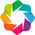

Unexpected exception formatting exception. Falling back to standard exception
time: 1.9 s (started: 2022-05-04 13:59:45 -05:00)


Traceback (most recent call last):
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3369, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/var/folders/2p/2j0f_d_13815dk9jyzwnfl540000gp/T/ipykernel_10860/352489477.py", line 10, in <cell line: 10>
    layout_nodes(graph, layout=nx.spring_layout,
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packages/param/parameterized.py", line 3652, in __new__
    return inst.__call__(*args,**params)
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packages/holoviews/core/operation.py", line 220, in __call__
    return element.apply(self, **kwargs)
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packages/holoviews/core/accessors.py", line 47, in pipelined_call
    result = __call__(*args, **kwargs)
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packa

In [477]:

# %%
import holoviews as hv
from holoviews import opts
hv.extension('bokeh')

kwargs = dict(width=1000, height=1000, xaxis=None, yaxis=None)
opts.defaults(opts.Nodes(**kwargs), opts.Graph(**kwargs))
# %%
from holoviews.element.graphs import layout_nodes
layout_nodes(graph, layout=nx.spring_layout, 
             kwargs={'weight':'weight', 'iterations':200, 'seed':100})


In [493]:
# Declare abstract edges
N = 8
node_indices = np.arange(N)
source = np.zeros(N)
target = node_indices

simple_graph = hv.Graph(((source, target),))
simple_graph
# Node info
np.random.seed(7)
x, y = simple_graph.nodes.array([0, 1]).T
node_labels = ['Output']+['Input']*(N-1)
edge_weights = np.random.rand(8)

# Declare Graph
nodes = hv.Nodes((x, y, node_indices, node_labels), vdims='Type')
graph = hv.Graph(((source, target, edge_weights), nodes, paths), vdims='Weight')

graph.opts(node_color='Type', edge_color='Weight', cmap=['blue', 'red'], edge_cmap='viridis')

:Graph   [start,end]   (Weight)

time: 137 ms (started: 2022-05-04 14:15:49 -05:00)


In [511]:
simple_graph.nodes.dimensions()

[Dimension('x'), Dimension('y'), Dimension('index')]

time: 2.17 ms (started: 2022-05-04 14:23:08 -05:00)
